In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

In [1]:
import warnings
warnings.simplefilter('ignore')

In [2]:
%config InlineBackend.figure_format='svg'

In [4]:
import os

In [5]:
sns.set()

In [6]:
df=pd.read_csv(r'D:\Documents\GitHub\My own labs\mlcourse.ai\data/telecom_churn.csv')

In [7]:
df.sample(10)

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
1880,CT,56,415,No,No,0,162.3,99,27.59,149.1,78,12.67,255.5,115,11.50,14.8,1,4.00,4,True
912,IA,45,510,No,No,0,159.8,91,27.17,120.4,86,10.23,163.0,93,7.34,10.6,3,2.86,2,False
1711,ID,138,415,Yes,Yes,17,225.2,116,38.28,173.4,88,14.74,145.8,99,6.56,11.7,4,3.16,0,False
413,MS,126,415,No,No,0,256.5,112,43.61,199.5,90,16.96,188.3,122,8.47,7.0,5,1.89,3,False
407,DE,122,510,No,No,0,157.1,134,26.71,184.9,122,15.72,197.2,59,8.87,8.5,5,2.30,4,True
704,MO,161,510,No,No,0,221.7,95,37.69,193.0,82,16.41,194.1,113,8.73,6.5,4,1.76,3,False
55,IN,81,408,No,No,0,175.5,67,29.84,249.3,85,21.19,270.2,98,12.16,10.2,3,2.75,1,False
852,KS,149,510,No,No,0,217.7,91,37.01,273.5,74,23.25,226.9,99,10.21,9.6,3,2.59,3,False
252,MS,82,408,No,No,0,207.0,90,35.19,232.9,83,19.80,172.4,108,7.76,9.1,8,2.46,3,False
2933,IL,98,510,Yes,No,0,158.4,71,26.93,306.6,66,26.06,144.2,93,6.49,2.1,4,0.57,1,False


# Univariate viz

In [8]:
features=['Total day minutes','Total intl calls']

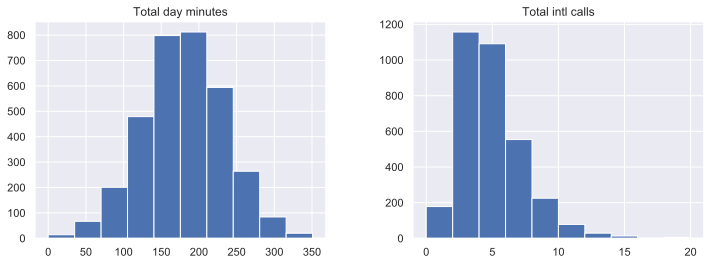

In [9]:
df[features].hist(figsize=(12,4));

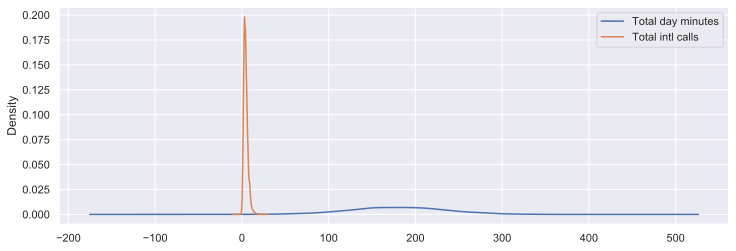

In [10]:
df[features].plot(kind='density',figsize=(12,4));

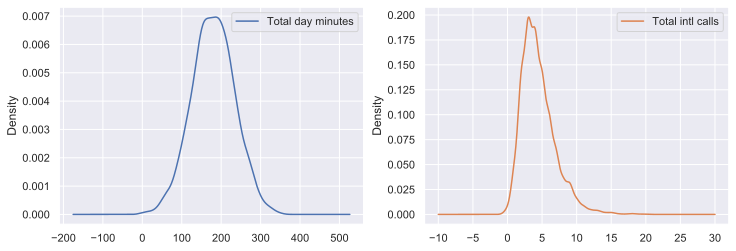

In [21]:
df[features].plot(kind='density',figsize=(12,4),subplots=True, layout=(1,2), sharex=False);

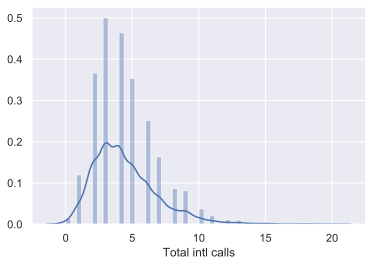

In [22]:
sns.distplot(df['Total intl calls']);

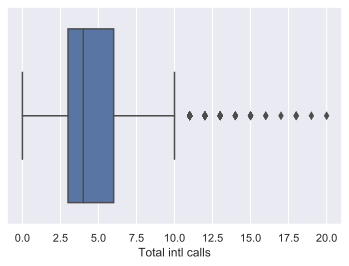

In [24]:
sns.boxplot(df['Total intl calls']);

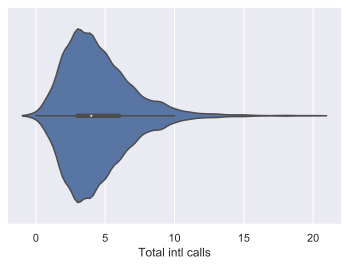

In [25]:
sns.violinplot(df['Total intl calls']);

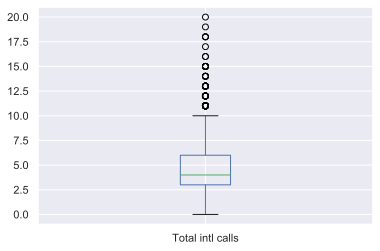

In [26]:
df['Total intl calls'].plot.box()

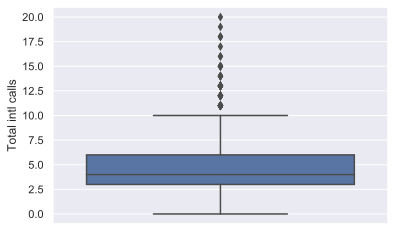

In [27]:
sns.boxplot(y=df['Total intl calls']);

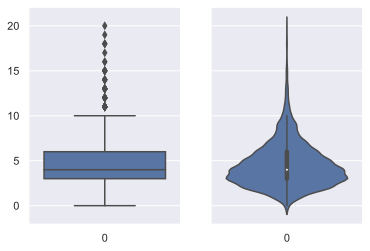

In [28]:
_, axes=plt.subplots(1,2, sharey=True, figsize=(6,4))
sns.boxplot(data=df['Total intl calls'],ax=axes[0])
sns.violinplot(data=df['Total intl calls'],ax=axes[1])



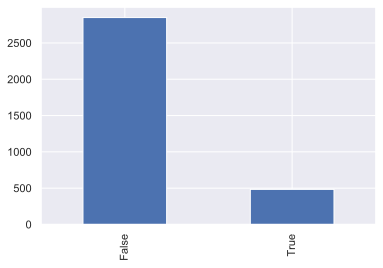

In [32]:
df.Churn.value_counts().plot.bar();

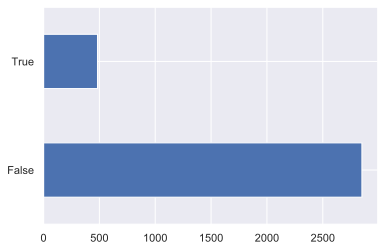

In [33]:
df.Churn.value_counts().plot.barh();

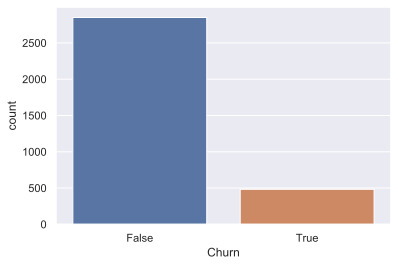

In [34]:
sns.countplot(df.Churn)

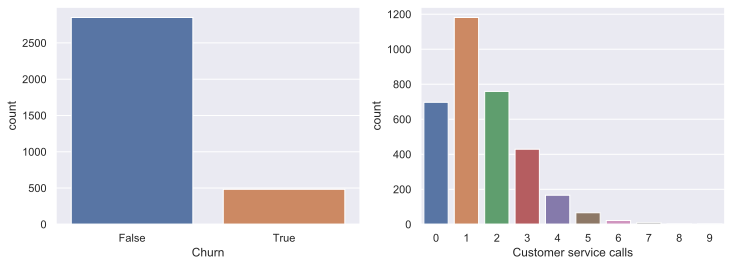

In [39]:
_, axes=plt.subplots(1,2,figsize=(12,4))
sns.countplot(df['Churn'],ax=axes[0])
sns.countplot(df['Customer service calls'],ax=axes[1])

# Multivariate viz

## Quant-quant

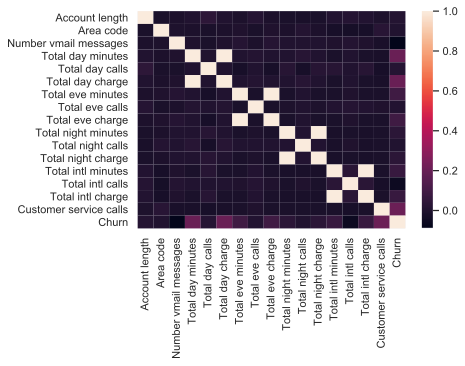

In [41]:
sns.heatmap(df.corr())

In [51]:
from sklearn.datasets import load_boston

In [58]:
data=load_boston()

In [59]:
data.keys()

dict_keys(['data', 'target', 'feature_names', 'DESCR', 'filename'])

In [60]:
ddf=data['data']

In [61]:
ddf=pd.DataFrame(ddf, columns=data['feature_names'])

In [62]:
ddf.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33


In [64]:
ddf.RAD=-ddf.RAD

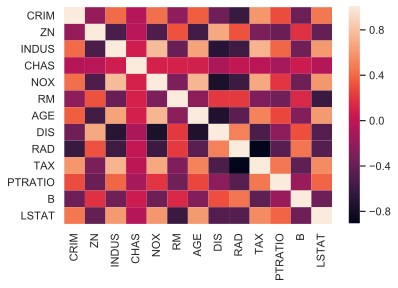

In [67]:
sns.heatmap((ddf.corr()));

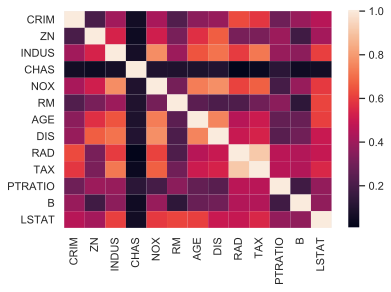

In [66]:
sns.heatmap(abs(ddf.corr()));

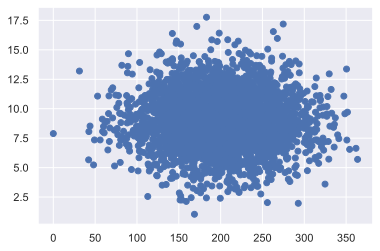

In [73]:
plt.scatter(x=df['Total eve minutes'],y=df['Total night charge'])

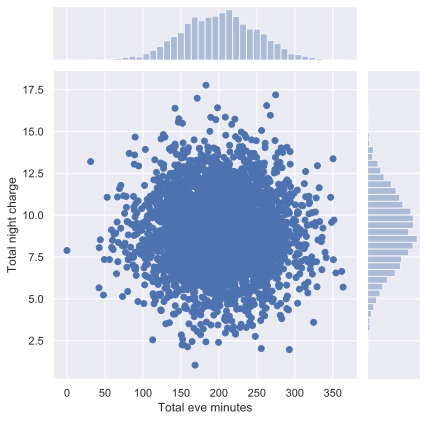

In [75]:
sns.jointplot(x='Total eve minutes',y='Total night charge', data=df)

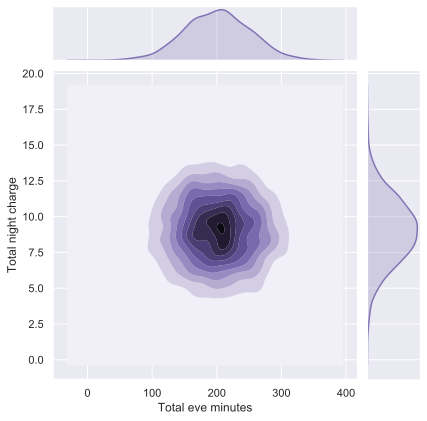

In [80]:
sns.jointplot(x='Total eve minutes',y='Total night charge', data=df, kind='kde', color='m')

## Quant-categorical

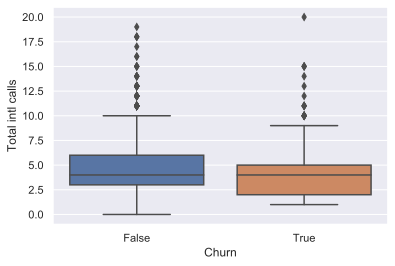

In [87]:
sns.boxplot(data=df, y='Total intl calls',x='Churn')

### 3dimensional boxplot

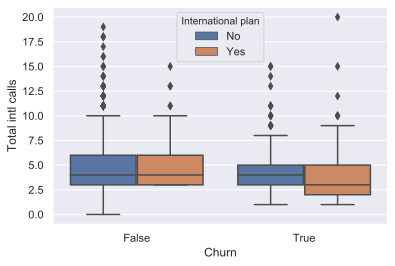

In [92]:
sns.boxplot(data=df, y='Total intl calls',x='Churn', hue='International plan')

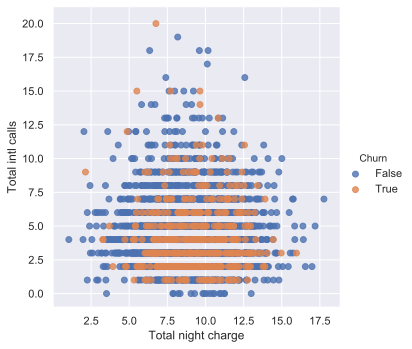

In [94]:
sns.lmplot(data=df, y='Total intl calls',x='Total night charge', hue='Churn', fit_reg=False)

In [95]:
df.columns

Index(['State', 'Account length', 'Area code', 'International plan',
       'Voice mail plan', 'Number vmail messages', 'Total day minutes',
       'Total day calls', 'Total day charge', 'Total eve minutes',
       'Total eve calls', 'Total eve charge', 'Total night minutes',
       'Total night calls', 'Total night charge', 'Total intl minutes',
       'Total intl calls', 'Total intl charge', 'Customer service calls',
       'Churn'],
      dtype='object')

In [102]:
num_features=list(set(df._get_numeric_data().columns)-set(['Area code','Churn']))

In [103]:
len(num_features)

15

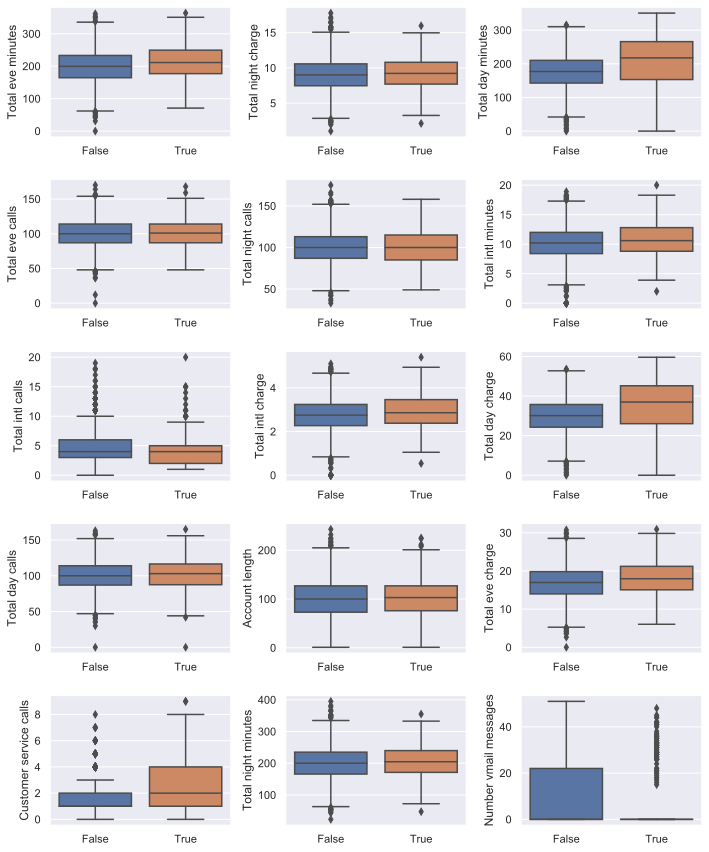

In [109]:
fig, axes=plt.subplots(5,3,figsize=(10,12))

for idx,feature in enumerate(num_features):
    ax=axes[idx//3,idx%3]
    sns.boxplot(x='Churn', y=feature, data=df, ax=ax)
    ax.set_xlabel('')
    ax.set_ylabel(feature)

fig.tight_layout();

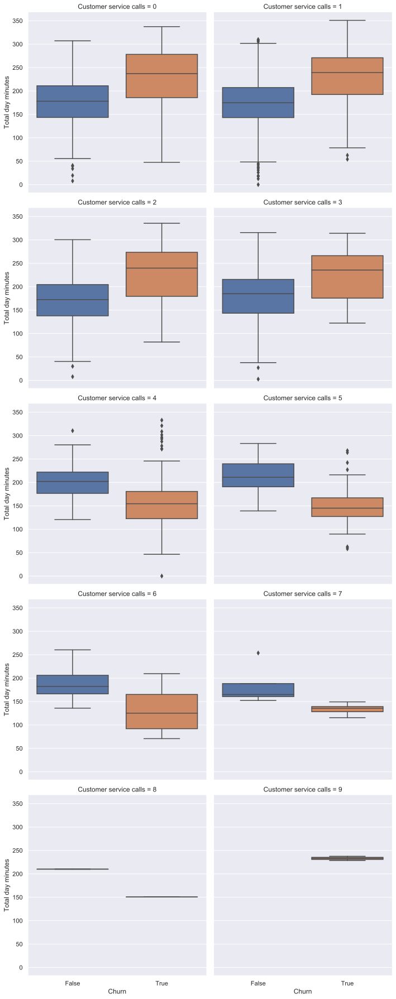

In [115]:
sns.factorplot(data=df, x='Churn', y='Total day minutes', col='Customer service calls', kind='box', col_wrap=2, size=5)

## Categorical-categorical

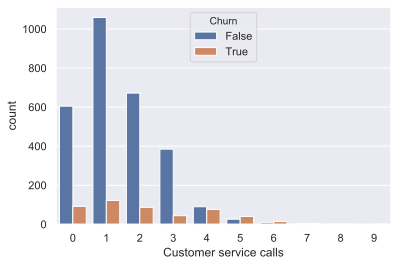

In [117]:
sns.countplot(x='Customer service calls', hue='Churn',data=df)

In [126]:
X=df.drop(['Churn','State'],axis=1)

In [127]:
X['International plan']=X['International plan'].map({'Yes':1,'No':0})
X['Voice mail plan']=X['Voice mail plan'].map({'Yes':1,'No':0})

In [129]:
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE

In [130]:
scaler=StandardScaler()
X_scaled=scaler.fit_transform(X)

In [134]:
pd.DataFrame(X_scaled).describe().T

,count,mean,std,min,25%,50%,75%,max
0,3333.0,1.713134e-16,1.00015,-2.513172,-0.679745,-0.001628,0.651374,3.564766
1,3333.0,1.177176e-16,1.00015,-0.688834,-0.688834,-0.523603,1.718817,1.718817
2,3333.0,-1.021951e-16,1.00015,-0.327580,-0.327580,-0.327580,-0.327580,3.052685
3,3333.0,6.921823e-17,1.00015,-0.618396,-0.618396,-0.618396,1.617086,1.617086
4,3333.0,3.832651e-16,1.00015,-0.591760,-0.591760,-0.591760,0.869554,3.134591
5,3333.0,7.081711e-16,1.00015,-3.301096,-0.662424,-0.006888,0.672520,3.140422
6,3333.0,-2.150828e-16,1.00015,-5.005247,-0.669570,0.028125,0.675985,3.217588
7,3333.0,-3.226409e-16,1.00015,-3.301162,-0.662376,-0.006730,0.672679,3.140803
8,3333.0,-1.067919e-16,1.00015,-3.963622,-0.678030,0.008276,0.676833,3.209066
9,3333.0,3.527531e-16,1.00015,-5.025911,-0.658361,-0.005739,0.697085,3.508382


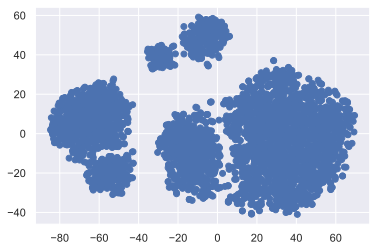

In [165]:
tsne=TSNE(random_state=11)
tsne_repr=tsne.fit_transform(X_scaled)

plt.scatter(tsne_repr[:,0],tsne_repr[:,1]);

In [138]:
pd.DataFrame(tsne_repr)

,0,1
0,60.407558,2.922122
1,72.471924,30.856216
2,-40.509327,-3.652977
3,32.542873,-41.958672
4,31.541903,-36.406754
...,...,...
3328,63.542507,31.704737
3329,-28.984081,3.164839
3330,-7.379466,34.950523
3331,26.706297,-21.758190


In [157]:
df.sample(2, random_state=42)

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
438,WY,113,510,No,No,0,155.0,93,26.35,330.6,106,28.10,189.4,123,8.52,13.5,3,3.65,1,False
2674,IL,67,415,No,No,0,109.1,117,18.55,217.4,124,18.48,188.4,141,8.48,12.8,6,3.46,0,False


In [164]:
pd.DataFrame(tsne_repr).iloc[438]

0   -10.898890
1    31.758493
Name: 438, dtype: float32

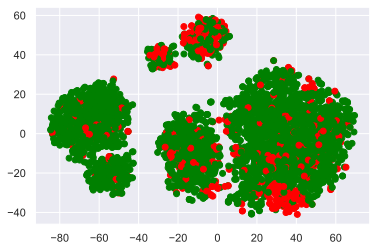

In [167]:
plt.scatter(tsne_repr[:,0],tsne_repr[:,1], c=df['Churn'].map({False:'green',True:'red'}));

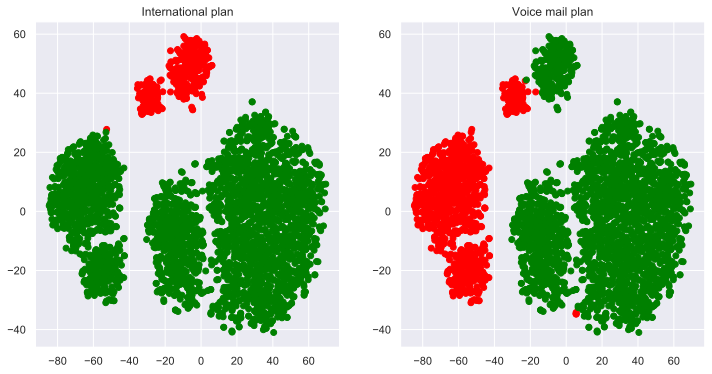

In [166]:
_,axes=plt.subplots(1,2, figsize=(12,6))

for i, feature in enumerate(['International plan','Voice mail plan']):
    axes[i].scatter(tsne_repr[:,0], tsne_repr[:,1],
                   c=df[feature].map({'No':'green','Yes':'red'}))
    axes[i].set_title(feature)

In [13]:
df.Churn=df.Churn.astype(int)

In [14]:
sns.pairplot(df.iloc[:100])